In [1]:
import os, warnings, random
import pandas as pd
import numpy as np
from math import ceil
from matplotlib import cm
from matplotlib import colors
from matplotlib import pyplot as plt
%matplotlib inline
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable

# # Import seaborn
# import seaborn as sns
# # Apply the default theme
# sns.set_theme()


from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [2]:
sampnams = ['Adry','Awet','Bwet']
filenrs = [list(range(28,129))] + [list(range(130,231))] + [list(range(235,336))]
filenrs_all = list(range(28,129)) + list(range(130,231)) + list(range(235,336))
saxs_labels = ['40-70 nm','6-12 nm','2-4 nm']

(3, 101, 101)


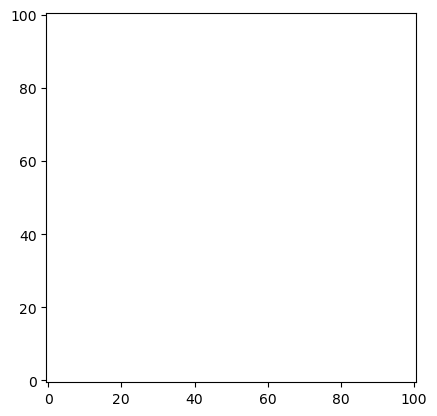

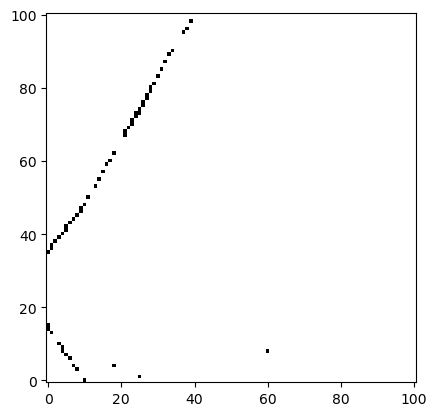

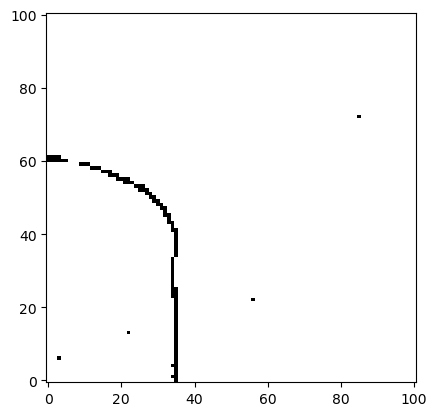

(30603,)
(163,)


In [3]:
# Load masks
path_masks = r'\\masks\\'
masks = np.array([np.load(path_masks+'mask_Adry.npy'),np.load(path_masks+'mask_Awet.npy'),np.load(path_masks+'mask_Bwet.npy')])
print(masks.shape)
for k in range(3):
    plt.imshow(masks[k,:],aspect='equal', origin="lower", cmap='binary')
    plt.show()

masks_flattened = np.ravel(masks)
print(masks_flattened.shape)
mask_nonzeros_flattened = np.nonzero(masks_flattened)[0]
print(mask_nonzeros_flattened.shape)

### SAXS/WAXS fit results and azimuthal FWHMs

In [4]:
path_saxswaxsres = r'\\Analysis\Analysis_Eq_Mer_WoodSAS_peaks\\'
path_fwhmres = r'\\Analysis\Mirrored_and_integrated\\'

filenames_saxswaxsres = []
filenames_fwhmres = []

for k,sampnam in enumerate(sampnams):
    filenames_saxswaxsres += [path_saxswaxsres+'results_saxs\mir_'+sampnam+'_{:03d}_saxs_res.txt'.format(x) for x in filenrs[k]]
    filenames_fwhmres += [path_fwhmres+sampnam+'\Azimuthal_profiles\mir_'+sampnam+'_{:03d}_azim_fwhms.txt'.format(x) for x in filenrs[k]]
#print(filenames_saxswaxsres,filenames_fwhmres)

In [5]:
# Import datasets
data_saxs = pd.DataFrame()
data_waxs = pd.DataFrame()
data_fwhm = pd.DataFrame()

for k,filename in enumerate(filenames_saxswaxsres):
    # SAXS data:
    data_saxs1 = pd.read_csv(filename, header=0, sep=',')
    data_saxs1.columns = data_saxs1.columns.str.replace('# Filenr', 'Filenr')
    data_saxs1.columns = data_saxs1.columns.str.replace(' ', '')
    data_saxs = pd.concat([data_saxs,data_saxs1])
    
    # WAXS data:
    data_waxs1 = pd.read_csv(filename.replace('_saxs','_waxs'), header=0, sep=',')
    data_waxs1.columns = data_waxs1.columns.str.replace('# Filenr', 'Filenr')
    data_waxs1.columns = data_waxs1.columns.str.replace(' ', '')
    data_waxs = pd.concat([data_waxs,data_waxs1])

    # FWHM data
    data_fwhm1 = pd.read_csv(filenames_fwhmres[k], header=1, sep=',')
    data_fwhm1.columns = data_fwhm1.columns.str.replace('# Columns: ', '')
    data_fwhm1.columns = data_fwhm1.columns.str.replace(' F', 'F')
    data_fwhm = pd.concat([data_fwhm,data_fwhm1])
    
print(data_saxs.keys())
print(data_waxs.keys())
print(data_fwhm.keys())

Index(['Filenr', 'A', 'e_A', '2R(nm)', 'e_2R(nm)', 'dR/R', 'e_dR/R', 'a(nm)',
       'e_a(nm)', 'da/a', 'e_da/a', 'B', 'e_B', 'sigma', 'e_sigma', 'C', 'e_C',
       'alpha', 'e_alpha', 'bg', 'e_bg'],
      dtype='object')
Index(['Filenr', 'loc1-10', 'amp1-10', 'wid1-10', 'loc110', 'amp110', 'wid110',
       'loc200_1', 'amp200_1', 'wid200_1', 'loc200_2', 'amp200_2', 'wid200_2',
       'loc004', 'amp004', 'wid004', 'loc004_2', 'amp004_2', 'wid004_2',
       'bg004', 'loc1-10_e', 'amp1-10_e', 'wid1-10_e', 'loc110_e', 'amp110_e',
       'wid110_e', 'loc200_1_e', 'amp200_1_e', 'wid200_1_e', 'loc200_2_e',
       'amp200_2_e', 'wid200_2_e', 'loc004_e', 'amp004_e', 'wid004_e',
       'loc004_2_e', 'amp004_2_e', 'wid004_2_e', 'bg004_e', 'd1-10(A)',
       'd110(A)', 'd200_1(A)', 'd200_2(A)', 'd004(A)', 'd1-10_e(A)',
       'd110_e(A)', 'd200_1_e(A)', 'd200_2_e(A)', 'd004_e(A)', 'L1-10(nm)',
       'L110(nm)', 'L200_1(nm)', 'L200_2(nm)', 'L004(nm)', 'L1-10_e(nm)',
       'L110_e(nm)', 'L200_1_e

### PARAMETERS SELECTION: 
These are the original fitting parameters (using these it is possible to reproduce the complete fits of the equatorial and meridional SAXS/WAXS intensities, including backgrounds; however, for the azimuthal intensities, only the peak width is included)

#### General Parameters:
To select the flow with general parameters use the next option and keep the structural parameters cell commented

In [6]:
selected_dfs = [data_saxs.filter(['A', '2R(nm)', 'a(nm)', 'da/a', 'B', 'C', 'alpha', 'bg'])]
selected_dfs += [data_waxs.filter(['loc1-10', 'amp1-10', 'wid1-10', 'loc110', 'amp110', 'wid110', 'loc200_1', 'amp200_1', 'wid200_1', 'loc200_2', 'amp200_2', 'wid200_2', 'loc004', 'amp004', 'wid004', 'loc004_2', 'amp004_2', 'wid004_2', 'bg004', 'lingbg_a', 'lingbg_b', 'Iwat'])]
selected_dfs += [data_fwhm.filter(['FWHM 200', 'FWHM 40-70 nm', 'FWHM 6-12 nm','FWHM 2-4 nm'])]
df1 = pd.concat(selected_dfs,axis=1)
df1

,A,2R(nm),a(nm),da/a,B,C,alpha,bg,loc1-10,amp1-10,...,amp004_2,wid004_2,bg004,lingbg_a,lingbg_b,Iwat,FWHM 200,FWHM 40-70 nm,FWHM 6-12 nm,FWHM 2-4 nm
0,0.33157,2.3644,2.8526,0.39827,2.851200e-01,1.080300e-06,4.0218,0.001162,1.00320,0.011539,...,0.002889,0.034746,0.000031,-0.004909,0.011300,0.005121,11.939,6.5121,12.389,10.724
1,0.24388,2.3494,2.9421,0.38666,2.513300e-01,9.957500e-07,4.0382,0.001237,1.00290,0.009383,...,0.002381,0.033823,0.000031,-0.004107,0.009398,0.004430,12.527,6.5891,12.887,11.025
2,0.20810,2.3447,2.9046,0.38830,2.185400e-01,9.809400e-07,4.0134,0.001113,1.00320,0.007790,...,0.002185,0.032976,0.000041,-0.003397,0.007796,0.003870,13.244,7.7727,13.419,11.596
3,0.18353,2.3563,2.8813,0.38632,2.000400e-01,7.813300e-07,4.0767,0.001066,1.00380,0.006847,...,0.001816,0.032602,0.000033,-0.002950,0.006729,0.003635,13.723,7.1687,14.171,12.173
4,0.13493,2.3299,2.9168,0.38916,1.885800e-01,8.083200e-07,3.9856,0.001123,1.00330,0.005546,...,0.001751,0.029613,0.000037,-0.002471,0.005638,0.003475,15.680,8.8807,16.025,14.144
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96,0.58748,2.5226,3.8810,0.40078,1.627700e-27,7.466900e-10,4.6891,0.001845,0.98544,0.005157,...,0.003772,0.022914,0.000522,-0.003613,0.007747,0.035352,12.524,13.2210,11.819,10.850
97,0.59015,2.5221,3.8587,0.40411,3.456800e-23,1.546600e-09,4.5307,0.001950,0.98712,0.005811,...,0.003667,0.024056,0.000420,-0.003706,0.007977,0.036733,12.637,12.1820,11.828,10.893
98,0.65825,2.5189,3.8804,0.40907,1.622300e-21,1.126800e-09,4.5932,0.002107,0.98999,0.006034,...,0.003915,0.024826,0.000340,-0.003951,0.008533,0.036591,12.490,12.3350,11.878,10.959
99,0.60312,2.5190,3.8707,0.40858,5.452300e-26,1.096200e-09,4.5739,0.002080,0.98565,0.005504,...,0.003526,0.025152,0.000316,-0.003762,0.008129,0.036401,12.840,10.8650,12.289,11.311


#### Structural Parameters:
To select the flow with structural parameters use the next option and keep the general parameters cell commented

In [7]:
#selected_dfs = [data_saxs.filter(['2R(nm)', 'a(nm)', 'da/a'])]
#selected_dfs += [data_waxs.filter(['d1-10(A)', 'd110(A)', 'd200_1(A)', 'd200_2(A)', 'd004(A)', 'L1-10(nm)', 'L110(nm)', 'L200_1(nm)', 'L200_2(nm)', 'L004(nm)', 'peakratio'])]
#selected_dfs += [data_fwhm.filter(['FWHM 200', 'FWHM 40-70 nm', 'FWHM 6-12 nm','FWHM 2-4 nm'])]
#df1 = pd.concat(selected_dfs,axis=1)
#df1

In [8]:
np.nonzero(masks_flattened)

(array([10211, 10327, 10512, 10612, 10623, 10813, 10913, 11013, 11069,
        11114, 11214, 11515, 11615, 11716, 13736, 13838, 13939, 14041,
        14143, 14245, 14347, 14448, 14550, 14652, 14754, 14856, 14957,
        15059, 15262, 15567, 15770, 15973, 16176, 16278, 16481, 16989,
        17090, 17192, 17294, 17395, 17497, 17598, 17599, 17700, 17802,
        17903, 18005, 18106, 18208, 18309, 18411, 18614, 18817, 19020,
        19223, 19325, 19833, 19935, 20138, 20437, 20537, 20538, 20639,
        20740, 20840, 20841, 20942, 21011, 21043, 21144, 21245, 21346,
        21447, 21548, 21649, 21737, 21750, 21851, 21952, 22053, 22154,
        22255, 22356, 22457, 22558, 22659, 22680, 22759, 22760, 22860,
        22861, 22961, 22962, 23062, 23163, 23264, 23365, 23466, 23567,
        23668, 23769, 23871, 23972, 24073, 24174, 24275, 24376, 24477,
        24577, 24578, 24678, 24778, 24779, 24879, 24979, 24980, 25080,
        25180, 25181, 25280, 25281, 25380, 25381, 25480, 25481, 25580,
      

In [9]:
# Insert np.nan to datapoints that should be neglected:
df1.iloc[mask_nonzeros_flattened] = [np.nan] * (df1.shape[1])
#df1.iloc[np.nonzero(masks_flattened)] = [np.nan] * (df1.shape[1])
df1[df1.isna().any(axis=1)]

# After this, df1 contains some rows with NaN (can be used for plotting 2D images so that dimensions are preserved)

,A,2R(nm),a(nm),da/a,B,C,alpha,bg,loc1-10,amp1-10,...,amp004_2,wid004_2,bg004,lingbg_a,lingbg_b,Iwat,FWHM 200,FWHM 40-70 nm,FWHM 6-12 nm,FWHM 2-4 nm
10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [10]:
# Create dataframe that exlcudes rows with NaN's, check that dimensions match

df1_exclnans = df1[~df1.isna().any(axis=1)]
df1_exclnans

print( df1.shape[0],':', df1_exclnans.shape[0], '+', len(mask_nonzeros_flattened), '=', df1_exclnans.shape[0]+len(mask_nonzeros_flattened))
print( df1_exclnans.shape[0]+len(mask_nonzeros_flattened) ==  df1.shape[0] )

# Dataframe df1_exclnans (same as df1 but without rows that are masked) should be used in analysis

30603 : 30440 + 163 = 30603
True


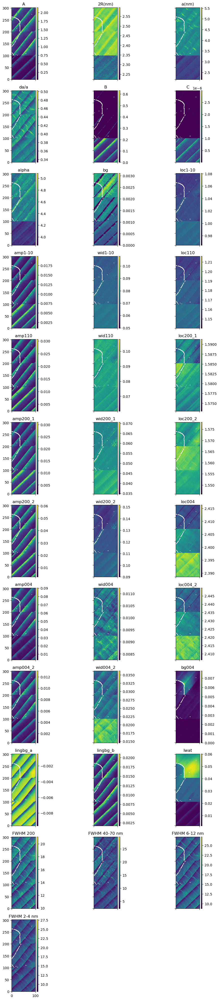

In [11]:
# Plot original data for reference:
fig,axs = plt.subplots(ncols=np.min([df1.shape[1],3]), nrows=ceil(df1.shape[1]/3), 
                       sharex=True, sharey=True,figsize=(10,3.333*ceil(df1.shape[1]/3)))

for n,ax in enumerate(np.ravel(axs)):
    if n > df1.shape[1]-1:
        ax.set_visible(False)
        continue
    im = ax.imshow(np.array(df1[df1.keys()[n]]).reshape(-1,101), aspect = 'equal', origin="lower")
    
    # for colorbars:
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(im, cax=cax, orientation='vertical')
    
    ax.set_title(df1.keys()[n])
plt.tight_layout()
plt.show()

## PCA

In [12]:
# Scale data before applying PCA, use fit and transform method (note: this data should not contain NaN's!)
scaling=StandardScaler()
scaling.fit(df1_exclnans)
Scaled_data=scaling.transform(df1_exclnans)
#Scaled_data

In [13]:
# Set nuber of PCs n_components
pca=PCA(n_components=4)
pca.fit(Scaled_data)
x_pca=pca.transform(Scaled_data)
 
# Check the dimensions of data after PCA
print(x_pca.shape)

(30440, 4)


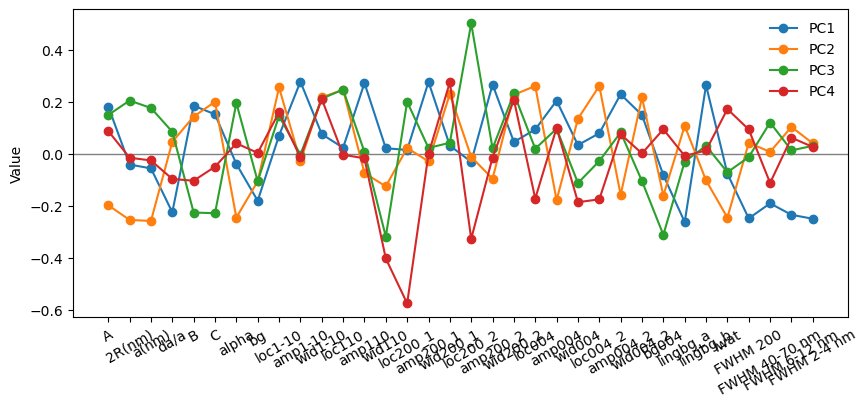

In [14]:
# Check the values of eigen vectors produced by principal components
plt.figure(figsize=(x_pca.shape[1]*2.5,4))
for n, pc in enumerate(pca.components_):
    plt.plot(df1.keys(), pc, '-o', label='PC'+str(n+1))
plt.axhline(0,c='grey',lw=1,zorder=-1)
plt.ylabel('Value')
plt.xticks(rotation=30)
plt.legend(frameon=False)
plt.show()

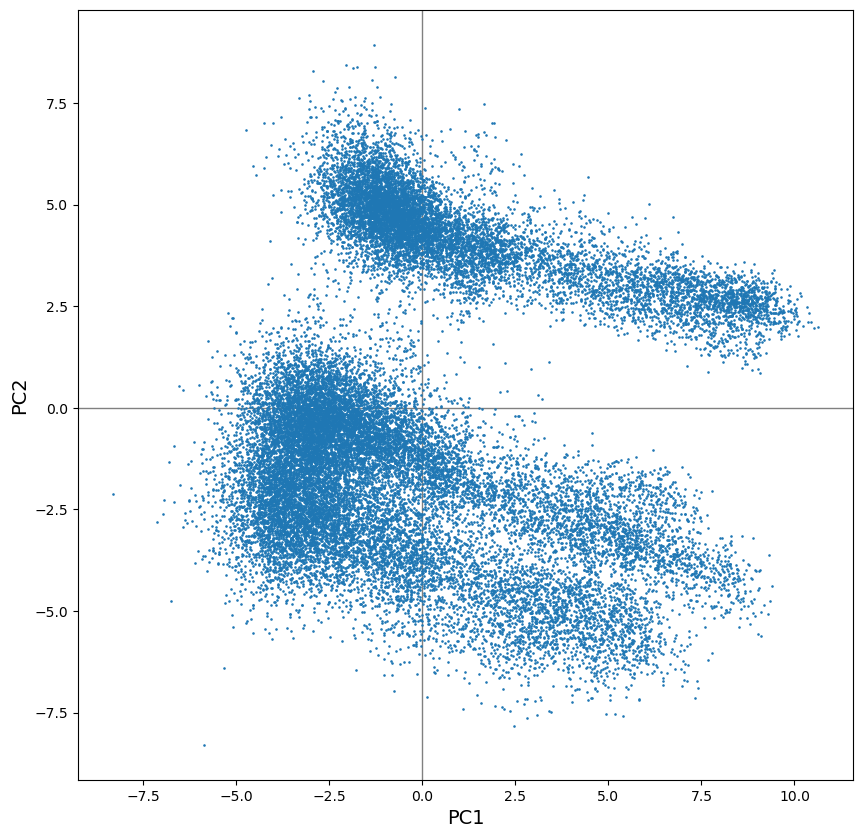

In [15]:
# 2D projection
PCS_to_plot = [1,2]

plt.figure(figsize=(10,10))
plt.scatter(x_pca[:,PCS_to_plot[0]-1],x_pca[:,PCS_to_plot[1]-1],marker='.',s=3)
#plt.scatter(x_pca[:,0][x_pca[:,0]>1.8],x_pca[:,1][x_pca[:,0]>1.8],marker='o',s=3)# This shows points where PC1>1.8 (should be done by clustering)
#plt.scatter(x_pca[:,0][x_pca[:,1]<-3],x_pca[:,1][x_pca[:,1]<-3],marker='s',s=3)# This shows points where PC2<-3 (should be done by clustering)
plt.xlabel('PC'+str(PCS_to_plot[0]),fontsize=14)
plt.ylabel('PC'+str(PCS_to_plot[1]),fontsize=14)
plt.axhline(0,c='grey',lw=1,zorder=-1)
plt.axvline(0,c='grey',lw=1,zorder=-1)

Text(0.5, 0, 'PC3')

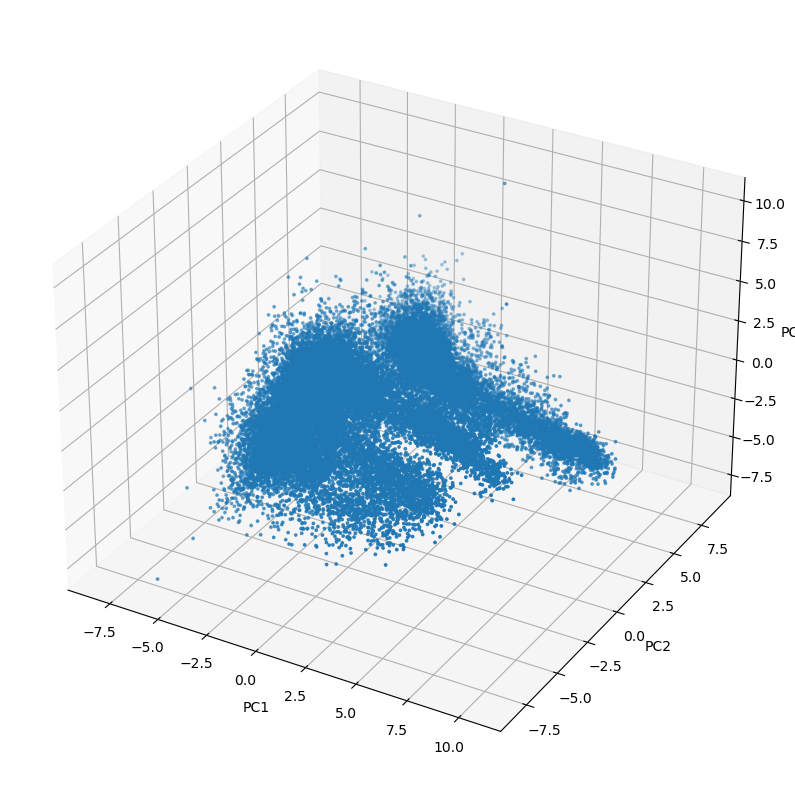

In [16]:
fig = plt.figure(figsize=(10,10))
 
# choose projection 3d for creating a 3d graph
axis = fig.add_subplot(111, projection='3d')
 
# x[:,0]is pc1,x[:,1] is pc2 while x[:,2] is pc3
axis.scatter(x_pca[:,0],x_pca[:,1],x_pca[:,2],s=3)
axis.set_xlabel("PC1", fontsize=10)
axis.set_ylabel("PC2", fontsize=10)
axis.set_zlabel("PC3", fontsize=10)

[0.35303811 0.33964915 0.07154126 0.05919201]


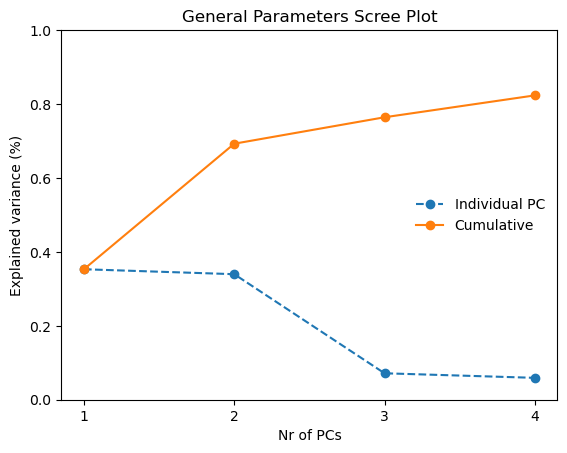

In [17]:
# check how much variance is explained by each pca component
print(pca.explained_variance_ratio_)
plt.plot(range(1, len(pca.explained_variance_ratio_)+1),pca.explained_variance_ratio_,'o--',label='Individual PC')
plt.plot(range(1, len(pca.explained_variance_ratio_)+1),np.cumsum(pca.explained_variance_ratio_),'o-',
         label='Cumulative')
plt.title("General Parameters Scree Plot")
plt.ylim((0,1))
plt.xticks(np.arange(1, len(pca.explained_variance_ratio_)+1))
plt.xlabel('Nr of PCs')
plt.ylabel(r'Explained variance (%)')
plt.legend(loc=5,frameon=False)
plt.show()

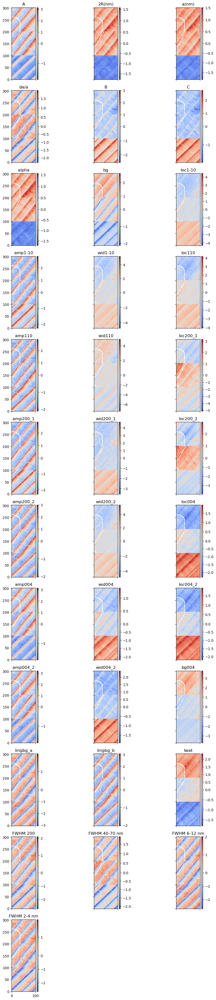

In [18]:
# This plots the inverse transform, i.e. the (scaled) data approximated by the chosen number of PCs
fig,axs = plt.subplots(ncols=np.min([df1.shape[1],3]), nrows=ceil(df1.shape[1]/3), 
                       sharex=True, sharey=True,figsize=(10,3.333*ceil(df1.shape[1]/3)))

for n,ax in enumerate(np.ravel(axs)):
    if n > df1.shape[1]-1:
        ax.set_visible(False)
        continue
    im = ax.imshow( np.insert(pca.inverse_transform(x_pca)[:,n], 
                              mask_nonzeros_flattened - np.arange(len(mask_nonzeros_flattened)), 
                              np.nan).reshape(-1,101), 
                   aspect = 'equal', origin="lower",cmap='coolwarm', norm=colors.TwoSlopeNorm(0))
    
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(im, cax=cax, orientation='vertical')
    
    ax.set_title(df1.keys()[n])
plt.tight_layout()
plt.show()

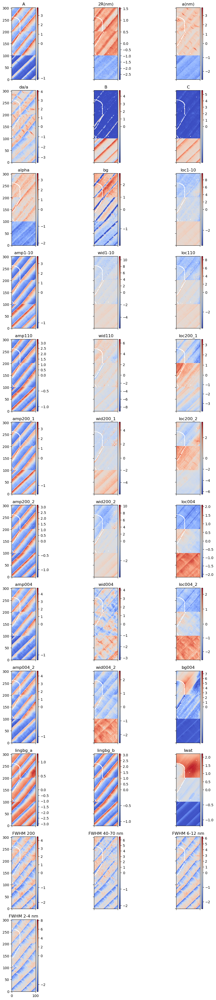

In [19]:
# Scaled original data for reference/comparison:
fig,axs = plt.subplots(ncols=np.min([df1.shape[1],3]), nrows=ceil(df1.shape[1]/3), 
                       sharex=True, sharey=True, figsize=(10,3.333*ceil(df1.shape[1]/3)))

for n,ax in enumerate(np.ravel(axs)):
    if n > df1.shape[1]-1:
        ax.set_visible(False)
        continue
    im = ax.imshow(np.insert(Scaled_data[:,n], 
                              mask_nonzeros_flattened - np.arange(len(mask_nonzeros_flattened)), 
                              np.nan).reshape(-1,101), aspect = 'equal', origin="lower",
                   cmap='coolwarm', norm=colors.TwoSlopeNorm(0))
    
    # for colorbars:
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(im, cax=cax, orientation='vertical')
    
    ax.set_title(df1.keys()[n])
plt.tight_layout()
plt.show()

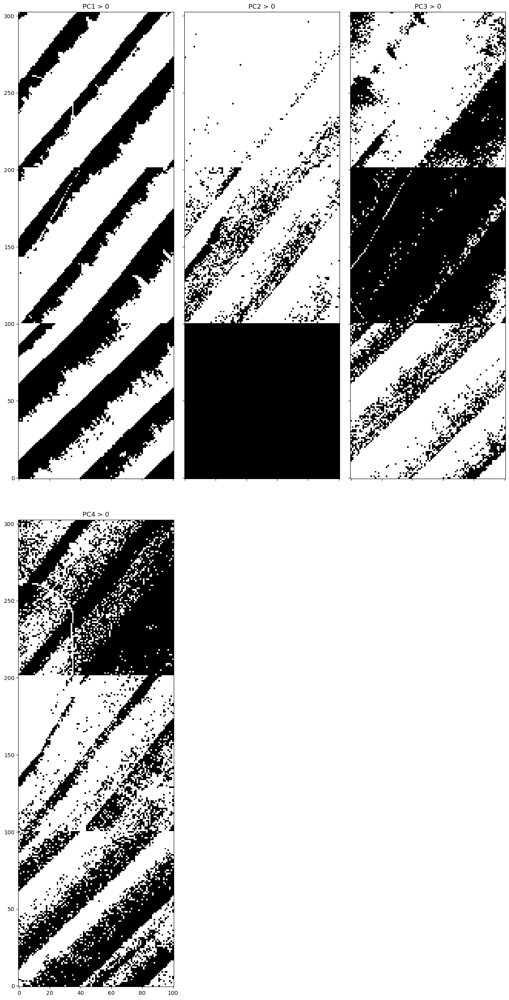

In [20]:
# A coarse way of classifying pixels in the image based on the value of the PC (PC > pc_lim)

pc_lim = 0 # Points where PC is larger than this value will be shown in black

fig,axs = plt.subplots(ncols=np.min([x_pca.shape[1],3]), nrows=ceil(x_pca.shape[1]/3), 
                       sharex=True, sharey=True,figsize=(13,13*ceil(x_pca.shape[1]/3)))
for n,ax in enumerate(np.ravel(axs)):
    if n > x_pca.shape[1]-1:
        ax.set_visible(False)
        continue
    xtoplot = np.where(x_pca[:,n]>pc_lim,1,0)
    xtoplot = np.insert(xtoplot, mask_nonzeros_flattened - np.arange(len(mask_nonzeros_flattened)), 0.5)
    im = ax.imshow(xtoplot.reshape(-1,101), aspect = 'equal', origin="lower",cmap='binary')
    ax.set_title('PC'+str(n+1)+' > '+str(pc_lim))
plt.tight_layout()
plt.show()

### Clustering

In [21]:
import time
import warnings
from sklearn import cluster, datasets, mixture
from sklearn.neighbors import kneighbors_graph
from itertools import cycle, islice

#### Use different PCA

In [22]:
select_the_number_of_classes = 4

In [23]:
default_base = {
    "quantile": 0.3,
    "eps": 0.3,
    "damping": 0.9,
    "preference": -200,
    "n_neighbors": 7,
    "n_clusters": select_the_number_of_classes,
    "min_samples": 7,
    "xi": 0.05,
    "min_cluster_size": 0.1,
}

params = default_base.copy()

In [24]:
# normalize dataset for easier parameter selection
#X = StandardScaler().fit_transform(X)
X = x_pca

# estimate bandwidth for mean shift
bandwidth = cluster.estimate_bandwidth(X, quantile=params["quantile"])

# connectivity matrix for structured Ward
connectivity = kneighbors_graph(
    X, n_neighbors=params["n_neighbors"], include_self=False)
    
# make connectivity symmetric
connectivity = 0.5 * (connectivity + connectivity.T)


In [25]:
    # ============
    # Create cluster objects
    # ============
    two_means = cluster.MiniBatchKMeans(n_clusters=params["n_clusters"])
    ward = cluster.AgglomerativeClustering(
        n_clusters=params["n_clusters"], linkage="ward", connectivity=connectivity
    )
    spectral = cluster.SpectralClustering(
        n_clusters=params["n_clusters"],
        eigen_solver="arpack",
        affinity="nearest_neighbors",
        n_neighbors=params["n_neighbors"]
    )
    gmm = mixture.GaussianMixture(
        n_components=params["n_clusters"], covariance_type="full"
    )



In [26]:
plot_num = 1
num_graphs = 8
Results = {}

To perform clustering on the PCA and show the results in different number of PCs

In [27]:
def apply_different_pca(pca_a, pca_b):
    
    random_seed = 144  # Seed
    random.seed(random_seed)
    np.random.seed(random_seed)

    clustering_algorithms = (
        ("MiniBatch\nKMeans", two_means),
        ("Spectral\nClustering", spectral),
        ("Gaussian\nMixture", gmm),
        ("Ward", ward)
    )

    for name, algorithm in clustering_algorithms:

        with warnings.catch_warnings():
            warnings.filterwarnings(
                "ignore",
                message="the number of connected components of the "
                + "connectivity matrix is [0-9]{1,2}"
                + " > 1. Completing it to avoid stopping the tree early.",
                category=UserWarning)
            warnings.filterwarnings(
                "ignore",
                message="Graph is not fully connected, spectral embedding"
                + " may not work as expected.",
                category=UserWarning)

            algorithm.fit(X)
            
            t1 = time.time()

            if hasattr(algorithm, "labels_"):
                y_pred = algorithm.labels_.astype(int)
            else:
                y_pred = algorithm.predict(X)
            
            Results.update({name: y_pred})

            custom_colors = np.array(
                list(
                    islice(
                        cycle(
                            [
                                "#377eb8", #blue
                                "#4daf4a", #green
                                "#f781bf", #pink
                                "#ff7f00", #orange
                            
                                "#a65628",
                                "#984ea3",
                                "#999999",
                                "#e41a1c",
                                "#dede00",
                            ]),
                        int(max(y_pred) + 1))))

            print(name)
            plt.scatter(X[:, pca_a], X[:, pca_b], s=1, color=custom_colors[y_pred])
            plt.title(name)
            plt.xlabel('Principal component '+str(pca_a+1),fontsize=14)
            plt.ylabel('Principal component '+str(pca_b+1),fontsize=14)
            plt.axhline(0,c='grey',lw=1,zorder=-1)
            plt.axvline(0,c='grey',lw=1,zorder=-1)
            plt.gca().set_aspect('equal', adjustable='box')
            plt.show()

            # Plot 2D figure showing the classes in real space
            plt.figure(figsize=(4,12))
            cmap = colors.ListedColormap(np.append(custom_colors[:int(max(y_pred))+1], "#FFFFFF"))
            y_pred_toplot = np.insert(y_pred, mask_nonzeros_flattened - np.arange(len(mask_nonzeros_flattened)), 4)
            
            # save data
            fileName = r'\\Analysis\Clustering\OPTION1-4classes_{}.npy'.format(name.split("\n")[0])
            np.save(fileName, np.array(y_pred_toplot, dtype='int64'))
            
            plt.imshow(y_pred_toplot.reshape(-1,101), aspect = 'equal', origin="lower",cmap=cmap)
            #plt.colorbar() # This can be used to check that the colors are correct
            plt.tight_layout()
            plt.axis('off')
            plt.show()
            
             
           # Compute cluster means
            class_0_mean = np.mean(df1_exclnans[y_pred == 0])
            class_1_mean = np.mean(df1_exclnans[y_pred == 1])
            class_2_mean = np.mean(df1_exclnans[y_pred == 2])
            class_3_mean = np.mean(df1_exclnans[y_pred == 3])
            cluster_mean = pd.DataFrame({'class_0': class_0_mean, 'class_1': class_1_mean, 'class_2': class_2_mean, 'class_3': class_3_mean})
            mean_fileName = r'\\Analysis\Clustering\OPTION1-4cluster_mean_{}.csv'.format(name.split("\n")[0])
            cluster_mean.to_csv(mean_fileName)

            # Compute cluster standard deviations
            class_0_std = np.std(df1_exclnans[y_pred == 0])
            class_1_std = np.std(df1_exclnans[y_pred == 1])
            class_2_std = np.std(df1_exclnans[y_pred == 2])
            class_3_std = np.std(df1_exclnans[y_pred == 3])
            cluster_std = pd.DataFrame({'class_0': class_0_std, 'class_1': class_1_std, 'class_2': class_2_std, 'class_3': class_3_std})
            std_fileName = r'\\Analysis\Clustering\OPTION1-4cluster_std_{}.csv'.format(name.split("\n")[0])
            cluster_std.to_csv(std_fileName)

For visualizing PC1 and PC2

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1930: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=3)
C:\ProgramData\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1962: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


MiniBatch
KMeans


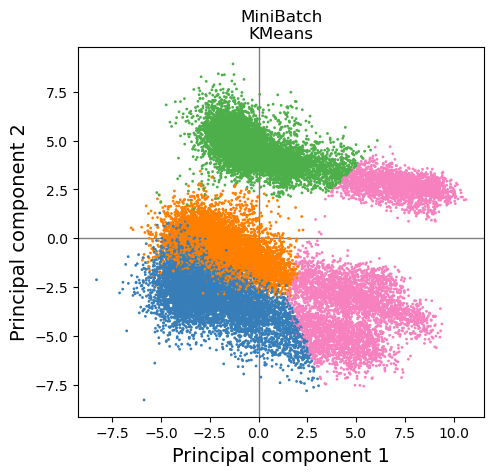

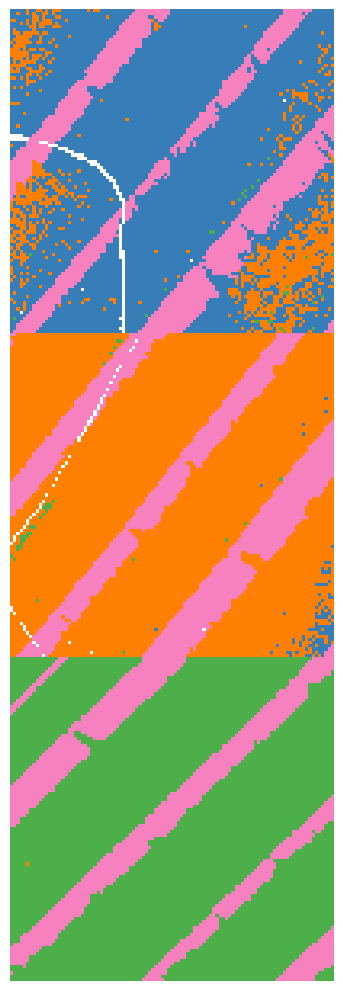

C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
C:\ProgramData\anaconda3\Lib\si

Spectral
Clustering


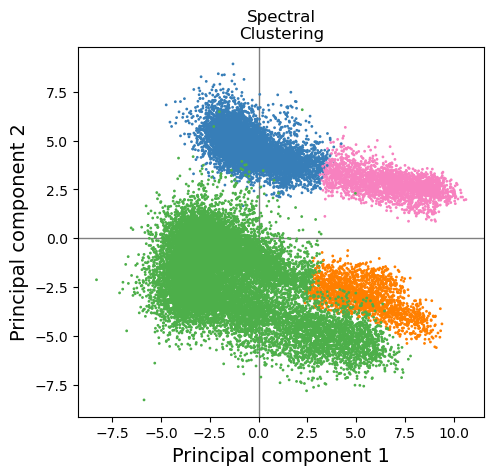

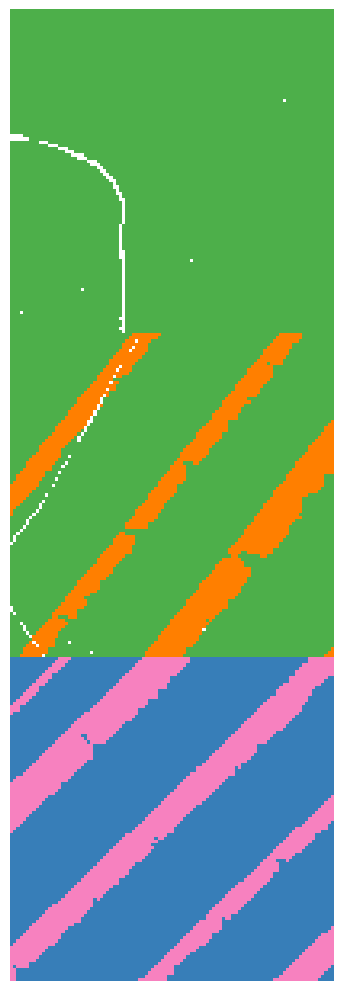

C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
C:\ProgramData\anaconda3\Lib\si

Gaussian
Mixture


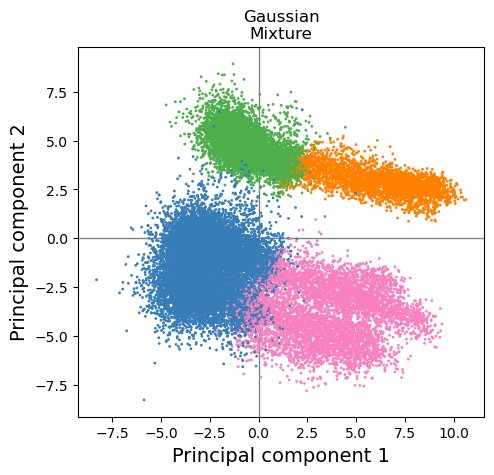

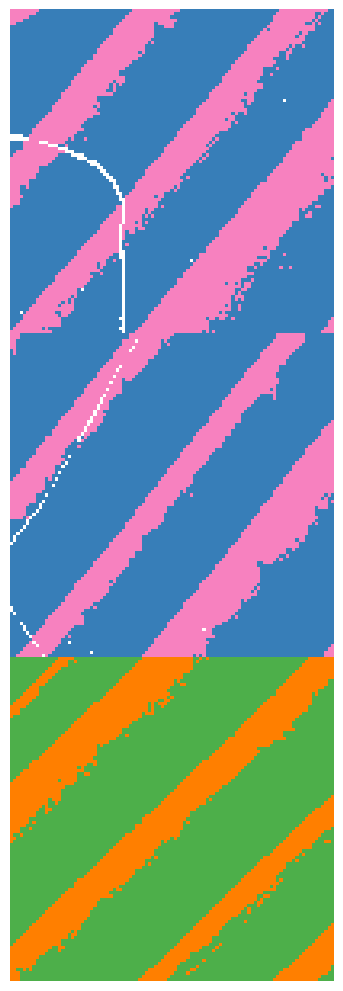

C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
C:\ProgramData\anaconda3\Lib\si

Ward


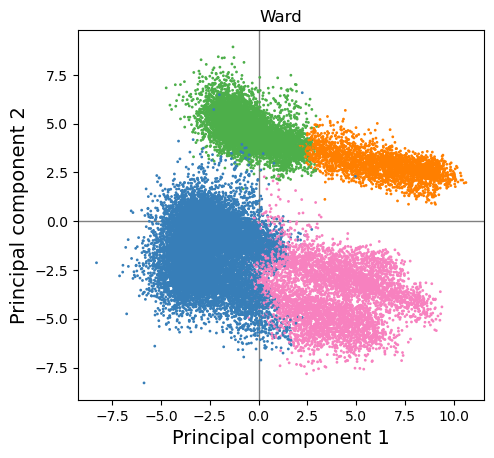

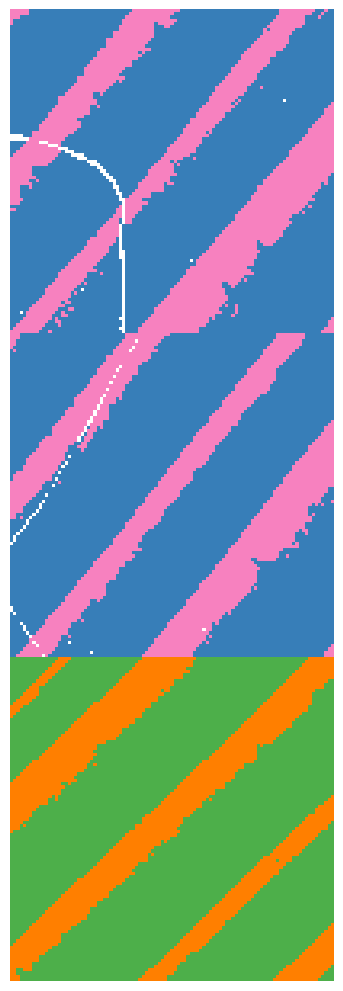

C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
C:\ProgramData\anaconda3\Lib\si

In [28]:
apply_different_pca(0, 1)

Calculate class mean values

In [29]:
for name, y_pred in Results.items():
    print(f"Retracing points for {name} clusters:")
    
    for cluster_label in range(max(y_pred) + 1):
        cluster_points = np.where(y_pred == cluster_label)[0]
        
        # Calculate the correct shape for unravel_index
        shape = (X.shape[0], 101)
        
        retraced_points = np.unravel_index(cluster_points, shape)
        
        # Now, 'retraced_points' contains the coordinates (row, column) of each point in the cluster
        # You can further process or visualize these points as needed
        print(f"Cluster {cluster_label}: {len(retraced_points[0])} points at {retraced_points}")
    
    print("\n")


Retracing points for MiniBatch
KMeans clusters:
Cluster 0: 7111 points at (array([101, 101, 101, ..., 301, 301, 301], dtype=int64), array([86, 91, 92, ..., 36, 37, 38], dtype=int64))
Cluster 1: 8044 points at (array([  0,   0,   0, ..., 246, 248, 255], dtype=int64), array([ 0,  1,  2, ..., 60, 59, 45], dtype=int64))
Cluster 2: 6519 points at (array([  0,   0,   0, ..., 301, 301, 301], dtype=int64), array([41, 42, 43, ..., 29, 30, 31], dtype=int64))
Cluster 3: 8766 points at (array([ 36, 101, 101, ..., 300, 300, 300], dtype=int64), array([ 5,  0,  1, ..., 63, 65, 66], dtype=int64))


Retracing points for Spectral
Clustering clusters:
Cluster 0: 7595 points at (array([  0,   0,   0, ..., 100, 100, 100], dtype=int64), array([ 2,  3,  4, ..., 90, 91, 92], dtype=int64))
Cluster 1: 18221 points at (array([101, 101, 101, ..., 301, 301, 301], dtype=int64), array([ 0,  1,  2, ..., 36, 37, 38], dtype=int64))
Cluster 2: 2606 points at (array([  0,   0,   0, ..., 100, 100, 100], dtype=int64), arra

In [30]:
# Compute cluster means for each algorithm's result
for name, y_pred in Results.items():
    print(f"Computing means for {name} clusters:")

    cluster_means = {}
    for cluster_label in range(max(y_pred) + 1):
        cluster_data = df1_exclnans[y_pred == cluster_label]  # FIXED LINE
        cluster_means[f'class_{cluster_label}'] = cluster_data.mean(axis=0)

    cluster_mean_df = pd.DataFrame(cluster_means)
    print(cluster_mean_df)

    mean_fileName = r'\\Analysis\Clustering\FinalMeans_{}.csv'.format(name.split("\n")[0])
    cluster_mean_df.to_csv(mean_fileName)


Computing means for MiniBatch
KMeans clusters:
                    class_0       class_1       class_2       class_3
A              4.637324e-01  1.223306e-01  1.113327e+00  3.961320e-01
2R(nm)         2.512057e+00  2.354811e+00  2.489594e+00  2.517339e+00
a(nm)          3.906737e+00  2.822514e+00  3.595072e+00  3.819645e+00
da/a           4.174203e-01  4.113601e-01  3.832706e-01  4.259217e-01
B              8.789206e-04  1.118030e-01  1.565720e-01  5.931708e-04
C              8.931767e-09  6.981234e-07  5.407442e-07  1.043514e-08
alpha          4.448314e+00  4.059969e+00  4.353450e+00  4.395712e+00
bg             1.930845e-03  8.939238e-04  5.600189e-04  1.397569e-03
loc1-10        9.858796e-01  1.005448e+00  9.952240e-01  9.930208e-01
amp1-10        3.521319e-03  4.440954e-03  1.171217e-02  3.471825e-03
wid1-10        6.623564e-02  7.318669e-02  7.013624e-02  6.921627e-02
loc110         1.155383e+00  1.168121e+00  1.160919e+00  1.163541e+00
amp110         6.858790e-03  6.586501e-03  